**Step 1-Inspecting the dataset(EDA)**

In [1]:
import os
import glob
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt

# Use the local dataset in VS Code, with Colab compatibility as a fallback.
workspace_dataset_root = os.path.join(
    os.getcwd(),
    "Clinical oral images",
)
colab_dataset_root = "/content"
dataset_root = (
    workspace_dataset_root
    if os.path.isdir(workspace_dataset_root)
    else colab_dataset_root
)

cancer_path = os.path.join(dataset_root, "cancer")
non_cancer_path = os.path.join(dataset_root, "non-cancer")

print("Dataset root:", dataset_root)
print("Cancer path:", cancer_path)
print("Non-cancer path:", non_cancer_path)

image_extensions = (
    ".jpg", ".jpeg", ".png",
    ".gif", ".bmp", ".tiff", ".webp"
)

%store cancer_path
%store non_cancer_path
%store dataset_root
%store image_extensions

Dataset root: /Users/deeshanikhilkalantri/Desktop/Oral Cancer/OralCancer dataset/Oral_Cancer_Detection/Clinical oral images
Cancer path: /Users/deeshanikhilkalantri/Desktop/Oral Cancer/OralCancer dataset/Oral_Cancer_Detection/Clinical oral images/cancer
Non-cancer path: /Users/deeshanikhilkalantri/Desktop/Oral Cancer/OralCancer dataset/Oral_Cancer_Detection/Clinical oral images/non-cancer
Stored 'cancer_path' (str)
Stored 'non_cancer_path' (str)
Stored 'dataset_root' (str)
Stored 'image_extensions' (tuple)


In [2]:
# Retrieve stored paths
%store -r cancer_path
%store -r non_cancer_path
%store -r image_extensions

def get_image_info(path, label, extensions):
    image_files = []
    corrupted_files = []
    file_extensions = set()

    if not os.path.exists(path):
        print(f"Warning: Path not found for {label}: {path}")
        return image_files, corrupted_files, file_extensions

    for root, _, files in os.walk(path):
        for file in files:
            if file.lower().endswith(extensions):
                filepath = os.path.join(root, file)
                file_extensions.add(os.path.splitext(file)[1].lower())
                try:
                    img = Image.open(filepath)
                    img.verify() # Verify if it's a valid image
                    image_files.append(filepath)
                except Exception as e:
                    corrupted_files.append(filepath)
                    # print(f"Could not open or verify {filepath}: {e}") # Optional: print all errors
    return image_files, corrupted_files, file_extensions

print("\n--- Dataset Image Counts, Extensions, and Sample Filenames ---")

cancer_image_files, cancer_corrupted_files, cancer_extensions = get_image_info(cancer_path, 'cancer', image_extensions)
non_cancer_image_files, non_cancer_corrupted_files, non_cancer_extensions = get_image_info(non_cancer_path, 'non cancer', image_extensions)

# 4. Count the number of images in each class
print(f"\nNumber of 'cancer' images found: {len(cancer_image_files)}")
print(f"Number of 'non cancer' images found: {len(non_cancer_image_files)}")

# 5. Check image extensions
all_extensions = cancer_extensions.union(non_cancer_extensions)
print(f"\nImage extensions found: {', '.join(sorted(list(all_extensions)))}")

# 6. Display the first 10 image filenames from each class
print("\nFirst 10 'cancer' image filenames:")
for i, img_path in enumerate(cancer_image_files[:10]):
    print(f"  {os.path.basename(img_path)}")

print("\nFirst 10 'non cancer' image filenames:")
for i, img_path in enumerate(non_cancer_image_files[:10]):
    print(f"  {os.path.basename(img_path)}")

# 7. Check whether any files are corrupted or unreadable (initial check)
print("\n--- Corrupted/Unreadable Files (Initial Check) ---")
if cancer_corrupted_files:
    print(f"Corrupted/Unreadable 'cancer' images found: {len(cancer_corrupted_files)}")
    for f in cancer_corrupted_files[:5]: # Display first 5 corrupted files
        print(f"  {f}")
else:
    print("No corrupted/unreadable 'cancer' images found in this initial check.")

if non_cancer_corrupted_files:
    print(f"Corrupted/Unreadable 'non cancer' images found: {len(non_cancer_corrupted_files)}")
    for f in non_cancer_corrupted_files[:5]: # Display first 5 corrupted files
        print(f"  {f}")
else:
    print("No corrupted/unreadable 'non cancer' images found in this initial check.")


# Store image file lists for later use
%store cancer_image_files
%store non_cancer_image_files
%store cancer_corrupted_files
%store non_cancer_corrupted_files


--- Dataset Image Counts, Extensions, and Sample Filenames ---

Number of 'cancer' images found: 587
Number of 'non cancer' images found: 494

Image extensions found: .jpeg, .jpg, .png

First 10 'cancer' image filenames:
  373.jpeg
  236.jpeg
  324.jpeg
  261.jpeg
  dataset_280x190_tongue_cancer_facts_ref_guide.jpg
  148.jpeg
  images (2).jpeg
  298.jpeg
  332.jpeg
  download.jpeg

First 10 'non cancer' image filenames:
  373.jpeg
  236.jpeg
  tongue-1.jpg
  20200314_1125032.jpg
  324.jpeg
  261.jpeg
  148.jpeg
  298.jpeg
  332.jpeg
  277.jpeg

--- Corrupted/Unreadable Files (Initial Check) ---
No corrupted/unreadable 'cancer' images found in this initial check.
No corrupted/unreadable 'non cancer' images found in this initial check.
Stored 'cancer_image_files' (list)
Stored 'non_cancer_image_files' (list)
Stored 'cancer_corrupted_files' (list)
Stored 'non_cancer_corrupted_files' (list)



--- Sample Cancer Images ---
  373.jpeg: Dimensions: 241x175, Channels: 3
  236.jpeg: Dimensions: 851x811, Channels: 3
  324.jpeg: Dimensions: 689x752, Channels: 3
  261.jpeg: Dimensions: 789x844, Channels: 3
  dataset_280x190_tongue_cancer_facts_ref_guide.jpg: Dimensions: 280x190, Channels: 3


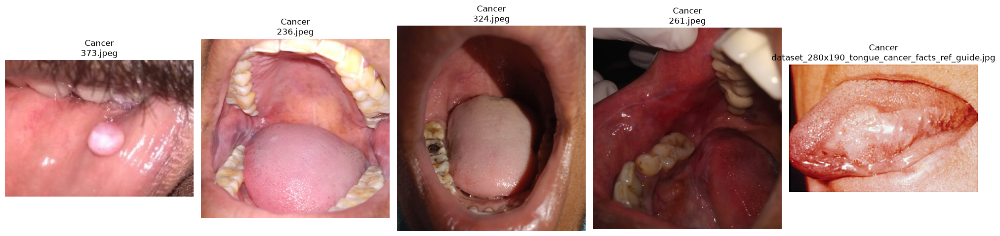


--- Sample Non cancer Images ---
  373.jpeg: Dimensions: 468x650, Channels: 3
  236.jpeg: Dimensions: 720x1280, Channels: 3
  tongue-1.jpg: Dimensions: 4497x3002, Channels: 3
  20200314_1125032.jpg: Dimensions: 1624x1169, Channels: 3
  324.jpeg: Dimensions: 720x891, Channels: 3


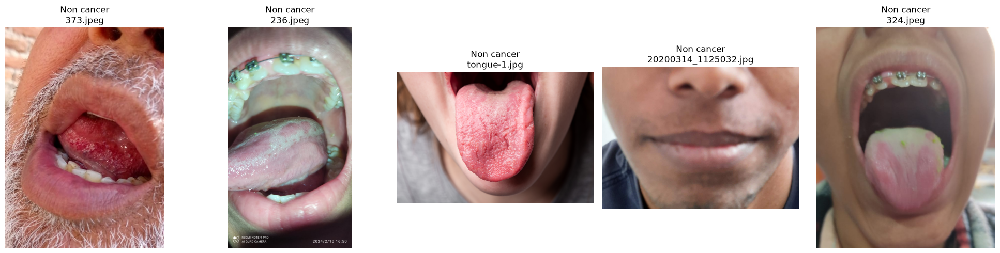

In [7]:
# Retrieve stored image file lists
%store -r cancer_image_files
%store -r non_cancer_image_files

# 8. Display sample images from both classes with their labels
# 9. Print image dimensions and color channels

def display_and_info_images(image_paths, label, num_samples=5):
    print(f"\n--- Sample {label.capitalize()} Images ---")
    fig, axes = plt.subplots(1, num_samples, figsize=(20, 5))
    if num_samples == 1:
        axes = [axes]

    for i, img_path in enumerate(image_paths[:num_samples]):
        try:
            img = Image.open(img_path)
            axes[i].imshow(img)
            axes[i].set_title(f"{label.capitalize()}\n{os.path.basename(img_path)}")
            axes[i].axis('off')

            # Print dimensions and color channels
            width, height = img.size
            channels = len(img.getbands())
            print(f"  {os.path.basename(img_path)}: Dimensions: {width}x{height}, Channels: {channels}")
        except Exception as e:
            print(f"  Could not load/display {os.path.basename(img_path)}: {e}")
            axes[i].set_title(f"Error loading {label}")
            axes[i].axis('off')
    plt.tight_layout()
    plt.show()

# Display 5 sample cancer images
display_and_info_images(cancer_image_files, 'cancer', num_samples=5)

# Display 5 sample non-cancer images
display_and_info_images(non_cancer_image_files, 'non cancer', num_samples=5)

**Step 2-Preparing and Splitting the data for training and testing.**

In [8]:
# Retrieve stored image file lists
%store -r cancer_image_files
%store -r non_cancer_image_files

import hashlib
from tqdm import tqdm

# Combine all image paths with their labels
all_image_paths = []
labels = []

for img_path in cancer_image_files:
    all_image_paths.append(img_path)
    labels.append('cancer')

for img_path in non_cancer_image_files:
    all_image_paths.append(img_path)
    labels.append('non_cancer')

print(f"Total images collected: {len(all_image_paths)}")
print(f"Total labels collected: {len(labels)}")

# 6. Check for duplicate images (by content hash)
print("\n--- Checking for duplicate images by content hash ---")

# Dictionary to store file hashes and their paths
hashes = {}
duplicates = []

for img_path in tqdm(all_image_paths, desc="Calculating image hashes"):
    try:
        with open(img_path, 'rb') as f:
            file_hash = hashlib.md5(f.read()).hexdigest()
            if file_hash in hashes:
                duplicates.append((img_path, hashes[file_hash]))
            else:
                hashes[file_hash] = img_path
    except Exception as e:
        print(f"Could not hash {img_path}: {e}")

if duplicates:
    print(f"Found {len(duplicates)} duplicate images.")
    for dup1, dup2 in duplicates[:5]: # Display first 5 pairs of duplicates
        print(f"  Duplicate pair: '{dup1}' and '{dup2}'")
    print("Note: Duplicate images will be handled during the splitting process, ensuring unique images in splits.")
else:
    print("No duplicate images found by content hash.")

# Store combined data for next steps
%store all_image_paths
%store labels

Total images collected: 1081
Total labels collected: 1081

--- Checking for duplicate images by content hash ---


Calculating image hashes: 100%|██████████| 1081/1081 [00:00<00:00, 2875.98it/s]

Found 115 duplicate images.
  Duplicate pair: '/Users/deeshanikhilkalantri/Desktop/Oral Cancer/OralCancer dataset/Oral_Cancer_Detection/Clinical oral images/cancer/060.jpeg' and '/Users/deeshanikhilkalantri/Desktop/Oral Cancer/OralCancer dataset/Oral_Cancer_Detection/Clinical oral images/cancer/cancer 6.jpg'
  Duplicate pair: '/Users/deeshanikhilkalantri/Desktop/Oral Cancer/OralCancer dataset/Oral_Cancer_Detection/Clinical oral images/cancer/oralcancer1.png' and '/Users/deeshanikhilkalantri/Desktop/Oral Cancer/OralCancer dataset/Oral_Cancer_Detection/Clinical oral images/cancer/105.jpeg'
  Duplicate pair: '/Users/deeshanikhilkalantri/Desktop/Oral Cancer/OralCancer dataset/Oral_Cancer_Detection/Clinical oral images/cancer/skin-cancer-of-the-lip.jpg' and '/Users/deeshanikhilkalantri/Desktop/Oral Cancer/OralCancer dataset/Oral_Cancer_Detection/Clinical oral images/cancer/109.jpeg'
  Duplicate pair: '/Users/deeshanikhilkalantri/Desktop/Oral Cancer/OralCancer dataset/Oral_Cancer_Detection/C

Cancer images: 587
Non-cancer images: 494

Total valid images: 1081
label
cancer        587
non_cancer    494
Name: count, dtype: int64

Checking duplicate images...


Hashing images: 100%|██████████| 1081/1081 [00:00<00:00, 2962.50it/s]


Duplicates removed: 115
Images remaining: 966

Class distribution after cleaning:
label
cancer        486
non_cancer    480
Name: count, dtype: int64

========== SPLIT SUMMARY ==========
Training images: 676
Validation images: 145
Testing images: 145
Total: 966

========== CLASS DISTRIBUTION ==========
            Train  Validation  Test
label                              
cancer        340          73    73
non_cancer    336          72    72

========== OVERLAP CHECK ==========
Train-Validation overlap: 0
Train-Test overlap: 0
Validation-Test overlap: 0


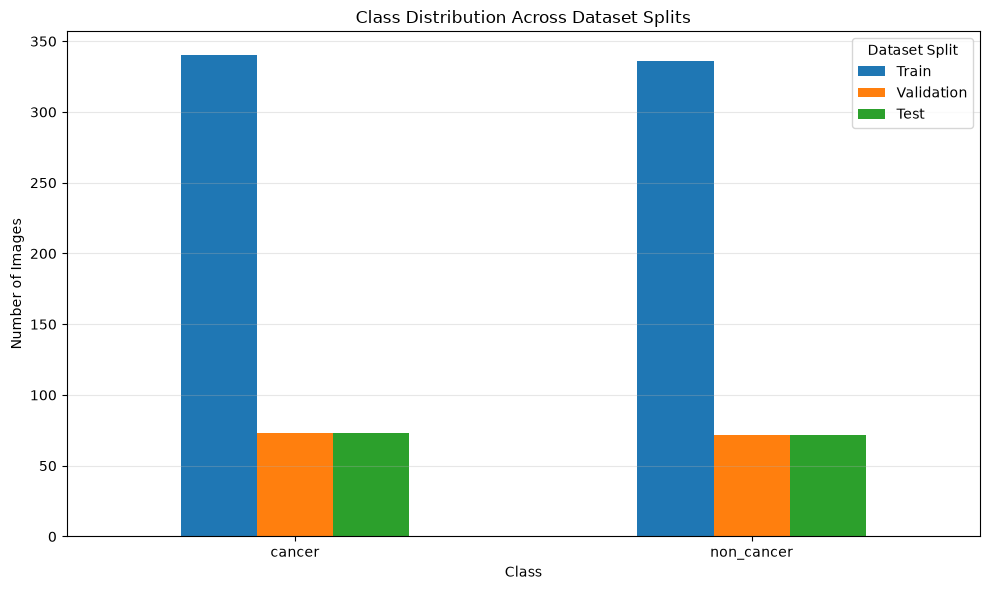

Stored 'train_df' (DataFrame)
Stored 'val_df' (DataFrame)
Stored 'test_df' (DataFrame)

SUCCESS: Dataset split completed.


In [3]:
# ============================================================
# STEP 2: CLEAN DATASET AND SPLIT
# TRAIN / VALIDATION / TEST
# ============================================================

import os
import hashlib
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from tqdm import tqdm

# ------------------------------------------------------------
# 1. Retrieve image lists
# ------------------------------------------------------------

%store -r cancer_image_files
%store -r non_cancer_image_files

print("Cancer images:", len(cancer_image_files))
print("Non-cancer images:", len(non_cancer_image_files))

# ------------------------------------------------------------
# 2. Combine image paths and labels
# ------------------------------------------------------------

all_image_paths = []
labels = []

for image_path in cancer_image_files:
    if os.path.isfile(image_path):
        all_image_paths.append(image_path)
        labels.append("cancer")

for image_path in non_cancer_image_files:
    if os.path.isfile(image_path):
        all_image_paths.append(image_path)
        labels.append("non_cancer")

dataset_df = pd.DataFrame({
    "image_path": all_image_paths,
    "label": labels
})

print("\nTotal valid images:", len(dataset_df))
print(dataset_df["label"].value_counts())

# ------------------------------------------------------------
# 3. Check minimum class samples
# ------------------------------------------------------------

class_counts = dataset_df["label"].value_counts()

if len(class_counts) < 2:
    raise ValueError(
        "Both cancer and non_cancer classes are required."
    )

if class_counts.min() < 4:
    raise ValueError(
        "Each class must have at least 4 images "
        "for train/validation/test splitting.\n"
        f"Class counts:\n{class_counts}"
    )

# ------------------------------------------------------------
# 4. Remove exact duplicate images
# ------------------------------------------------------------

def calculate_md5(image_path):
    try:
        with open(image_path, "rb") as file:
            return hashlib.md5(file.read()).hexdigest()
    except Exception:
        return None

print("\nChecking duplicate images...")

dataset_df["file_hash"] = [
    calculate_md5(path)
    for path in tqdm(
        dataset_df["image_path"],
        desc="Hashing images"
    )
]

before_duplicates = len(dataset_df)

dataset_df = dataset_df.drop_duplicates(
    subset="file_hash",
    keep="first"
).reset_index(drop=True)

print(
    "Duplicates removed:",
    before_duplicates - len(dataset_df)
)

dataset_df = dataset_df.drop(
    columns=["file_hash"]
)

print("Images remaining:", len(dataset_df))

# ------------------------------------------------------------
# 5. Check class counts after duplicate removal
# ------------------------------------------------------------

class_counts = dataset_df["label"].value_counts()

print("\nClass distribution after cleaning:")
print(class_counts)

if class_counts.min() < 4:
    raise ValueError(
        "Not enough images after duplicate removal.\n"
        f"Class counts:\n{class_counts}"
    )

# ------------------------------------------------------------
# 6. Train / temporary split
# ------------------------------------------------------------

train_df, temporary_df = train_test_split(
    dataset_df,
    test_size=0.30,
    random_state=42,
    stratify=dataset_df["label"]
)

# ------------------------------------------------------------
# 7. Validation / test split
# ------------------------------------------------------------

temporary_counts = temporary_df["label"].value_counts()

# Stratification requires at least 2 samples
# in every class in the temporary dataset.

if temporary_counts.min() >= 2:

    val_df, test_df = train_test_split(
        temporary_df,
        test_size=0.50,
        random_state=42,
        stratify=temporary_df["label"]
    )

else:

    print(
        "\nWarning: Temporary split has too few "
        "samples for stratification."
    )

    val_df, test_df = train_test_split(
        temporary_df,
        test_size=0.50,
        random_state=42,
        stratify=None
    )

# ------------------------------------------------------------
# 8. Reset indexes
# ------------------------------------------------------------

train_df = train_df.reset_index(drop=True)
val_df = val_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

# ------------------------------------------------------------
# 9. Print split summary
# ------------------------------------------------------------

print("\n========== SPLIT SUMMARY ==========")

print("Training images:", len(train_df))
print("Validation images:", len(val_df))
print("Testing images:", len(test_df))

print(
    "Total:",
    len(train_df) + len(val_df) + len(test_df)
)

print("\n========== CLASS DISTRIBUTION ==========")

distribution_table = pd.DataFrame({
    "Train": train_df["label"].value_counts(),
    "Validation": val_df["label"].value_counts(),
    "Test": test_df["label"].value_counts()
}).fillna(0).astype(int)

print(distribution_table)

# ------------------------------------------------------------
# 10. Check overlap
# ------------------------------------------------------------

train_paths = set(train_df["image_path"])
val_paths = set(val_df["image_path"])
test_paths = set(test_df["image_path"])

print("\n========== OVERLAP CHECK ==========")

print(
    "Train-Validation overlap:",
    len(train_paths.intersection(val_paths))
)

print(
    "Train-Test overlap:",
    len(train_paths.intersection(test_paths))
)

print(
    "Validation-Test overlap:",
    len(val_paths.intersection(test_paths))
)

# ------------------------------------------------------------
# 11. Plot distribution
# ------------------------------------------------------------

distribution_table.plot(
    kind="bar",
    figsize=(10, 6)
)

plt.title("Class Distribution Across Dataset Splits")
plt.xlabel("Class")
plt.ylabel("Number of Images")
plt.xticks(rotation=0)
plt.legend(title="Dataset Split")
plt.grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 12. Store data
# ------------------------------------------------------------

%store train_df
%store val_df
%store test_df

print("\nSUCCESS: Dataset split completed.")

**Step 3 — Preprocess the images**

## Image Preprocessing Pipeline

This section outlines the image preprocessing steps using `torchvision.transforms` for the oral cancer classification task. The goal is to prepare the image data for consumption by a Convolutional Neural Network (CNN), ensuring consistency and introducing data augmentation for the training set to improve model generalization.

In [4]:
import torch
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import os
from torch.utils.data import Dataset, DataLoader

# Define ImageNet mean and standard deviation for normalization
# These values are commonly used when working with pre-trained models on ImageNet.
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

print(f"ImageNet Mean: {IMAGENET_MEAN}")
print(f"ImageNet Standard Deviation: {IMAGENET_STD}")

ImageNet Mean: [0.485, 0.456, 0.406]
ImageNet Standard Deviation: [0.229, 0.224, 0.225]


### 1. Training Data Transformations

For the training set, we apply data augmentation techniques to introduce variability and help the model generalize better to unseen data. This reduces overfitting.

*   **`transforms.Resize((224, 224))`**: Resizes all images to a fixed size of 224x224 pixels. This is a standard input size for many pre-trained CNN architectures.
*   **`transforms.RandomHorizontalFlip()`**: Randomly flips the image horizontally with a default probability of 0.5. This helps the model learn that horizontal orientation does not affect the lesion's nature.
*   **`transforms.RandomRotation(10)`**: Randomly rotates the image by up to 10 degrees (clockwise or counter-clockwise). This helps the model become invariant to slight variations in image orientation.
*   **`transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1)`**: Randomly changes the brightness, contrast, and saturation of the images by a small factor (up to 10%). This makes the model more robust to varying lighting conditions and camera settings. The factors are kept small to avoid distorting clinically relevant features.
*   **`transforms.ToTensor()`**: Converts the PIL Image or numpy.ndarray to a PyTorch `FloatTensor` and scales the pixel intensity values from [0, 255] to [0.0, 1.0]. This is required for PyTorch models.
*   **`transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)`**: Normalizes the tensor image with the specified mean and standard deviation. This step is crucial when using pre-trained models (like those trained on ImageNet), as they expect inputs to be normalized in a similar way. It standardizes the input distribution, which often helps in faster convergence and better performance.

In [5]:
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1), # Mild color augmentation
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)
])

print("Training Transformations Defined:")
print(train_transform)

Training Transformations Defined:
Compose(
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
    RandomHorizontalFlip(p=0.5)
    RandomRotation(degrees=[-10.0, 10.0], interpolation=nearest, expand=False, fill=0)
    ColorJitter(brightness=(0.9, 1.1), contrast=(0.9, 1.1), saturation=(0.9, 1.1), hue=None)
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)


### 2. Validation and Test Data Transformations

For validation and test sets, we only apply transformations that ensure consistency without introducing randomness. This is because we want to evaluate the model's performance on a fixed, representative distribution of data.

*   **`transforms.Resize((224, 224))`**: Resizes all images to a fixed size of 224x224 pixels, consistent with the training data.
*   **`transforms.ToTensor()`**: Converts the PIL Image or numpy.ndarray to a PyTorch `FloatTensor` and scales the pixel intensity values from [0, 255] to [0.0, 1.0].
*   **`transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)`**: Normalizes the tensor image using the same ImageNet mean and standard deviation as the training set, maintaining consistency for the pre-trained model.

In [6]:
val_test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)
])

print("Validation and Test Transformations Defined:")
print(val_test_transform)

Validation and Test Transformations Defined:
Compose(
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)


### 3. Custom Dataset Class

To effectively use the transformations with PyTorch's `DataLoader`, we'll create a custom `Dataset` class. This class will handle loading images from their paths and applying the specified transformations.

In [7]:
class OralCancerDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe
        self.transform = transform
        # Map string labels to numerical format for PyTorch
        self.label_map = {'cancer': 0, 'non_cancer': 1}

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_path = self.dataframe.iloc[idx]['image_path']
        label_str = self.dataframe.iloc[idx]['label']
        label = self.label_map[label_str] # Convert string label to integer

        try:
            image = Image.open(img_path).convert('RGB') # Ensure image is RGB
        except Exception as e:
            print(f"Error loading image {img_path}: {e}")
            # Return a black image or handle error appropriately
            image = Image.new('RGB', (224, 224)) # Return a dummy image
            label = -1 # Indicate an error or skip this sample in DataLoader

        if self.transform:
            image = self.transform(image)

        return image, label

print("OralCancerDataset class defined.")

OralCancerDataset class defined.


### 4. Display Sample Images Before and After Preprocessing

Let's visualize the effect of the transformations on a few sample images from the training set. This helps confirm that the transformations are applied as expected and don't introduce unintended artifacts.

Since `train_df`, `val_df`, and `test_df` are stored from the previous cell, we will retrieve them here.

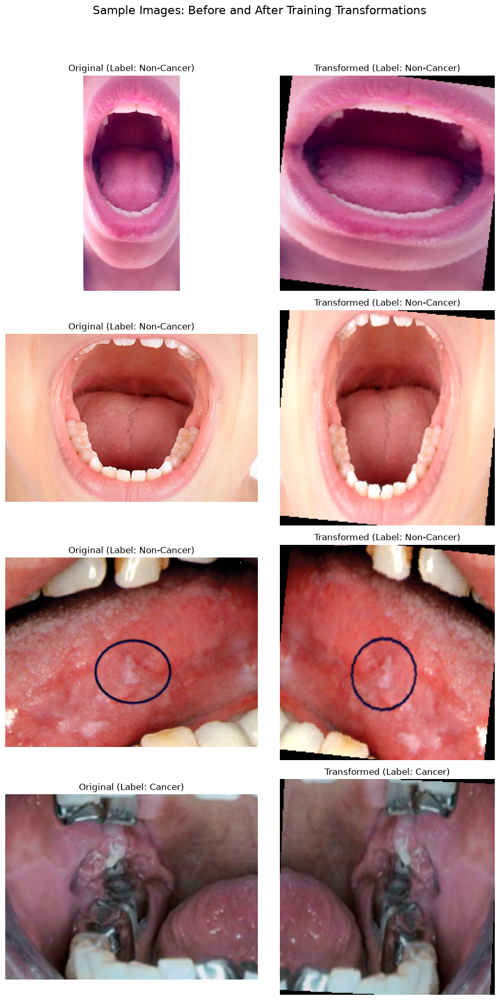

In [8]:
# Retrieve stored dataframes
%store -r train_df
%store -r val_df
%store -r test_df

# Instantiate datasets
train_dataset_raw = OralCancerDataset(train_df, transform=None) # No transform for raw display
train_dataset_transformed = OralCancerDataset(train_df, transform=train_transform)

# Function to denormalize image for display
def denormalize(tensor, mean, std):
    for t, m, s in zip(tensor, mean, std):
        t.mul_(s).add_(m) # Denormalize
    return tensor

# Display some sample images
num_samples_to_display = 4

fig, axes = plt.subplots(num_samples_to_display, 2, figsize=(10, 5 * num_samples_to_display))
fig.suptitle('Sample Images: Before and After Training Transformations', fontsize=16)

for i in range(num_samples_to_display):
    # Get raw image (before transform)
    raw_image, raw_label = train_dataset_raw[i]

    # Convert label to string for display
    raw_label_str = 'Cancer' if raw_label == 0 else 'Non-Cancer'

    axes[i, 0].imshow(raw_image)
    axes[i, 0].set_title(f"Original (Label: {raw_label_str})")
    axes[i, 0].axis('off')

    # Get transformed image
    transformed_image, transformed_label = train_dataset_transformed[i]

    # Convert label to string for display
    transformed_label_str = 'Cancer' if transformed_label == 0 else 'Non-Cancer'

    # Denormalize for correct display
    display_image = denormalize(transformed_image.clone(), IMAGENET_MEAN, IMAGENET_STD)
    axes[i, 1].imshow(display_image.permute(1, 2, 0)) # Change from (C, H, W) to (H, W, C)
    axes[i, 1].set_title(f"Transformed (Label: {transformed_label_str})")
    axes[i, 1].axis('off')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

**Step 4 — Build the PyTorch Dataset and DataLoaders**

Train Dataset size: 676 samples
Validation Dataset size: 145 samples
Test Dataset size: 145 samples
Class-to-index mapping: {'cancer': 0, 'non_cancer': 1}
DataLoaders created successfully.
Batch size: 32
Number of workers: 0
Batch image tensor shape: torch.Size([32, 3, 224, 224])
Batch label tensor shape: torch.Size([32])
Sample labels: [0, 0, 0, 0, 1]


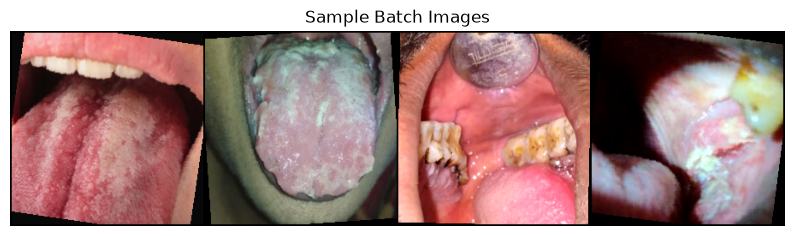

SUCCESS: PyTorch datasets and dataloaders created and verified.


In [8]:
# ============================================================
# CREATE PYTORCH DATASETS AND DATALOADERS
# ============================================================

import torch
import numpy as np
import matplotlib.pyplot as plt
import torchvision
from torch.utils.data import DataLoader

%store -r train_df
%store -r val_df
%store -r test_df

if "OralCancerDataset" not in globals():
    raise NameError("Run the dataset class cell before this cell.")

train_dataset = OralCancerDataset(train_df, transform=train_transform)
val_dataset = OralCancerDataset(val_df, transform=val_test_transform)
test_dataset = OralCancerDataset(test_df, transform=val_test_transform)

print(f"Train Dataset size: {len(train_dataset)} samples")
print(f"Validation Dataset size: {len(val_dataset)} samples")
print(f"Test Dataset size: {len(test_dataset)} samples")
print("Class-to-index mapping:", train_dataset.label_map)

BATCH_SIZE = 32
# Notebook kernels on macOS should use the main process for custom Dataset classes.
NUM_WORKERS = 0
USE_PIN_MEMORY = torch.cuda.is_available()

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=USE_PIN_MEMORY,
)
val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=USE_PIN_MEMORY,
)
test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=USE_PIN_MEMORY,
)

print("DataLoaders created successfully.")
print(f"Batch size: {BATCH_SIZE}")
print(f"Number of workers: {NUM_WORKERS}")

images, labels = next(iter(train_loader))
print(f"Batch image tensor shape: {images.shape}")
print(f"Batch label tensor shape: {labels.shape}")
print(f"Sample labels: {labels[:5].tolist()}")

# Display a small denormalized batch preview.
mean = torch.tensor(IMAGENET_MEAN).view(3, 1, 1)
std = torch.tensor(IMAGENET_STD).view(3, 1, 1)
preview = (images[:4] * std + mean).clamp(0, 1)
out = torchvision.utils.make_grid(preview)

plt.figure(figsize=(10, 5))
plt.imshow(out.permute(1, 2, 0).numpy())
plt.title("Sample Batch Images")
plt.axis("off")
plt.show()

print("SUCCESS: PyTorch datasets and dataloaders created and verified.")

**Step 5 — Build the CNN model**

In [9]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models

# 1. Device configuration

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# 2. Load ResNet18.
# Use ImageNet weights when available; fall back to local random initialization
# when the environment cannot verify the download certificate.
try:
    model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
    print("Loaded pretrained ImageNet weights.")
except Exception as error:
    print(f"Could not download ImageNet weights: {error}")
    print("Using a locally initialized ResNet18 instead.")
    model = models.resnet18(weights=None)

# 3. Replace the final fully connected layer for binary classification.
num_ftrs = model.fc.in_features
num_classes = 2
model.fc = nn.Linear(num_ftrs, num_classes)
model = model.to(device)

print("\n--- Model Architecture ---")
print(model)

total_params = sum(
    parameter.numel()
    for parameter in model.parameters()
    if parameter.requires_grad
)
print(f"\nTotal trainable parameters: {total_params:,}")

# 4. Define loss and optimizer.
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

print("\nLoss Function: CrossEntropyLoss")
print(f"Optimizer: Adam with learning rate {optimizer.defaults['lr']}")
print("\nModel setup complete. The model is ready for training.")

Using device: cpu
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /Users/deeshanikhilkalantri/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
Could not download ImageNet weights: <urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1082)>
Using a locally initialized ResNet18 instead.

--- Model Architecture ---
ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
      (relu): ReLU(inplace=True)

**Step 6 — Train the CNN**

/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Using device: cpu


Epoch 1/20 - Training:  23%|██▎       | 5/22 [00:07<00:25,  1.47s/it, loss=0.6165]/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/PIL/Image.py:1136: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [01/20] | Train Loss: 0.6400 | Train Acc: 0.6213 | Val Loss: 0.7780 | Val Acc: 0.5724
  ✓ Best model saved!


Epoch [02/20] | Train Loss: 0.5533 | Train Acc: 0.7071 | Val Loss: 0.5628 | Val Acc: 0.7310
  ✓ Best model saved!


Epoch [03/20] | Train Loss: 0.4513 | Train Acc: 0.7870 | Val Loss: 0.5178 | Val Acc: 0.7517
  ✓ Best model saved!


Epoch [04/20] | Train Loss: 0.4137 | Train Acc: 0.8121 | Val Loss: 0.4172 | Val Acc: 0.8000
  ✓ Best model saved!


Epoch [05/20] | Train Loss: 0.3952 | Train Acc: 0.8328 | Val Loss: 0.7850 | Val Acc: 0.7103
  No improvement (1/5)


Epoch [06/20] | Train Loss: 0.3743 | Train Acc: 0.8358 | Val Loss: 0.4667 | Val Acc: 0.8069
  No improvement (2/5)


Epoch [07/20] | Train Loss: 0.3068 | Train Acc: 0.8713 | Val Loss: 0.4367 | Val Acc: 0.8552
  No improvement (3/5)


Epoch [08/20] | Train Loss: 0.2846 | Train Acc: 0.8772 | Val Loss: 0.3460 | Val Acc: 0.8483
  ✓ Best model saved!


Epoch [09/20] | Train Loss: 0.2548 | Train Acc: 0.8876 | Val Loss: 0.3138 | Val Acc: 0.8690
  ✓ Best model saved!


Epoch [10/20] | Train Loss: 0.2258 | Train Acc: 0.9083 | Val Loss: 0.3763 | Val Acc: 0.8690
  No improvement (1/5)


Epoch [11/20] | Train Loss: 0.2227 | Train Acc: 0.9186 | Val Loss: 0.4809 | Val Acc: 0.8276
  No improvement (2/5)


Epoch [12/20] | Train Loss: 0.1994 | Train Acc: 0.9246 | Val Loss: 0.8438 | Val Acc: 0.7448
  No improvement (3/5)


Epoch [13/20] | Train Loss: 0.1988 | Train Acc: 0.9083 | Val Loss: 0.4706 | Val Acc: 0.8345
  No improvement (4/5)


Epoch [14/20] | Train Loss: 0.2020 | Train Acc: 0.9157 | Val Loss: 0.3918 | Val Acc: 0.8276
  No improvement (5/5)

Early stopping triggered.
Validation loss did not improve for 5 consecutive epochs.

TRAINING COMPLETED
Best validation loss: 0.3138
Best model saved at: best_oral_cancer_resnet18.pth


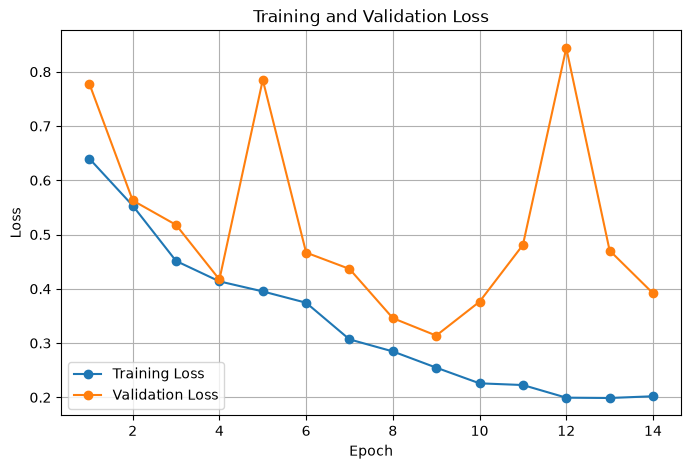

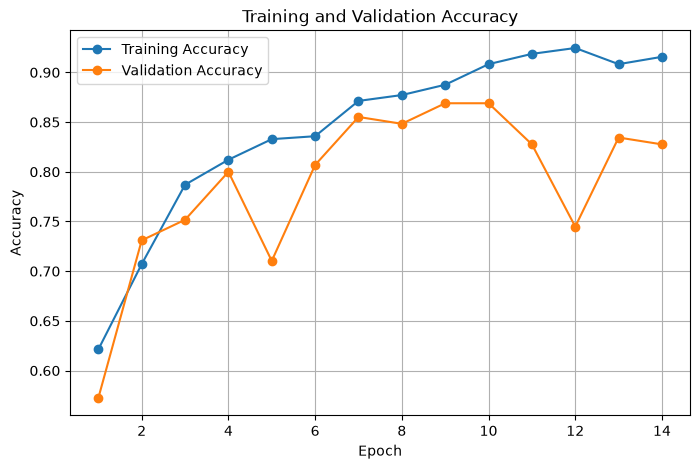

In [18]:
# ============================================================
# RESNET18 TRAINING - ORAL CANCER BINARY CLASSIFICATION
# ============================================================

import random
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt

from tqdm.auto import tqdm

# ------------------------------------------------------------
# 1. Reproducibility
# ------------------------------------------------------------

SEED = 42

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

# ------------------------------------------------------------
# 2. Select device
# ------------------------------------------------------------

if torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")

print("Using device:", device)

# ------------------------------------------------------------
# 3. Move model to device
# ------------------------------------------------------------

model = model.to(device)

# ------------------------------------------------------------
# 4. Loss function and optimizer
# ------------------------------------------------------------

criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.Adam(
    model.parameters(),
    lr=1e-4
)

# ------------------------------------------------------------
# 5. Training settings
# ------------------------------------------------------------

num_epochs = 20
patience = 5

best_val_loss = float("inf")
epochs_without_improvement = 0

# Store results
train_losses = []
val_losses = []

train_accuracies = []
val_accuracies = []

# Path to save best model
best_model_path = "best_oral_cancer_resnet18.pth"

# ------------------------------------------------------------
# 6. Training loop
# ------------------------------------------------------------

for epoch in range(num_epochs):

    # ========================================================
    # TRAINING
    # ========================================================

    model.train()

    running_train_loss = 0.0
    correct_train = 0
    total_train = 0

    train_progress = tqdm(
        train_loader,
        desc=f"Epoch {epoch + 1}/{num_epochs} - Training",
        leave=False
    )

    for images, labels in train_progress:

        # Move data to GPU/CPU
        images = images.to(device)
        labels = labels.to(device)

        # Clear previous gradients
        optimizer.zero_grad()

        # Forward pass
        outputs = model(images)

        # Calculate loss
        loss = criterion(outputs, labels)

        # Backpropagation
        loss.backward()

        # Update model weights
        optimizer.step()

        # Track loss
        running_train_loss += loss.item() * images.size(0)

        # Calculate predictions
        predictions = torch.argmax(outputs, dim=1)

        correct_train += (predictions == labels).sum().item()
        total_train += labels.size(0)

        # Update progress bar
        train_progress.set_postfix(
            loss=f"{loss.item():.4f}"
        )

    # Average training loss and accuracy
    epoch_train_loss = running_train_loss / total_train
    epoch_train_accuracy = correct_train / total_train

    # ========================================================
    # VALIDATION
    # ========================================================

    model.eval()

    running_val_loss = 0.0
    correct_val = 0
    total_val = 0

    with torch.no_grad():

        val_progress = tqdm(
            val_loader,
            desc=f"Epoch {epoch + 1}/{num_epochs} - Validation",
            leave=False
        )

        for images, labels in val_progress:

            images = images.to(device)
            labels = labels.to(device)

            # Forward pass
            outputs = model(images)

            # Validation loss
            loss = criterion(outputs, labels)

            running_val_loss += loss.item() * images.size(0)

            # Predictions
            predictions = torch.argmax(outputs, dim=1)

            correct_val += (predictions == labels).sum().item()
            total_val += labels.size(0)

    # Average validation loss and accuracy
    epoch_val_loss = running_val_loss / total_val
    epoch_val_accuracy = correct_val / total_val

    # --------------------------------------------------------
    # Store metrics
    # --------------------------------------------------------

    train_losses.append(epoch_train_loss)
    val_losses.append(epoch_val_loss)

    train_accuracies.append(epoch_train_accuracy)
    val_accuracies.append(epoch_val_accuracy)

    # --------------------------------------------------------
    # Print epoch results
    # --------------------------------------------------------

    print(
        f"Epoch [{epoch + 1:02d}/{num_epochs}] | "
        f"Train Loss: {epoch_train_loss:.4f} | "
        f"Train Acc: {epoch_train_accuracy:.4f} | "
        f"Val Loss: {epoch_val_loss:.4f} | "
        f"Val Acc: {epoch_val_accuracy:.4f}"
    )

    # ========================================================
    # SAVE BEST MODEL
    # ========================================================

    if epoch_val_loss < best_val_loss:

        best_val_loss = epoch_val_loss
        epochs_without_improvement = 0

        torch.save(
            model.state_dict(),
            best_model_path
        )

        print("  ✓ Best model saved!")

    else:

        epochs_without_improvement += 1

        print(
            f"  No improvement "
            f"({epochs_without_improvement}/{patience})"
        )

    # ========================================================
    # EARLY STOPPING
    # ========================================================

    if epochs_without_improvement >= patience:

        print("\nEarly stopping triggered.")
        print(
            f"Validation loss did not improve for "
            f"{patience} consecutive epochs."
        )

        break

# ============================================================
# 7. Training completed
# ============================================================

print("\n" + "=" * 60)
print("TRAINING COMPLETED")
print("=" * 60)

print(f"Best validation loss: {best_val_loss:.4f}")
print(f"Best model saved at: {best_model_path}")

# ============================================================
# 8. Plot loss curves
# ============================================================

epochs_completed = range(1, len(train_losses) + 1)

plt.figure(figsize=(8, 5))

plt.plot(
    epochs_completed,
    train_losses,
    marker="o",
    label="Training Loss"
)

plt.plot(
    epochs_completed,
    val_losses,
    marker="o",
    label="Validation Loss"
)

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.legend()
plt.grid(True)
plt.show()

# ============================================================
# 9. Plot accuracy curves
# ============================================================

plt.figure(figsize=(8, 5))

plt.plot(
    epochs_completed,
    train_accuracies,
    marker="o",
    label="Training Accuracy"
)

plt.plot(
    epochs_completed,
    val_accuracies,
    marker="o",
    label="Validation Accuracy"
)

plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")
plt.legend()
plt.grid(True)
plt.show()

**Step 7 — Evaluate the model properly**

Device: cpu
Best ResNet18 model loaded successfully.
Class mapping: 0 = Cancer, 1 = Non-cancer

RESNET18 TEST SET RESULTS
Accuracy     : 0.8207 (82.07%)
Precision    : 0.7831 (78.31%)
Recall       : 0.8904 (89.04%)
Sensitivity  : 0.8904 (89.04%)
Specificity  : 0.7500 (75.00%)
F1-score     : 0.8333
ROC-AUC      : 0.9113

True Positives  (Cancer): 65
False Negatives (Cancer): 8
False Positives (Cancer): 18
True Negatives  (Cancer): 54


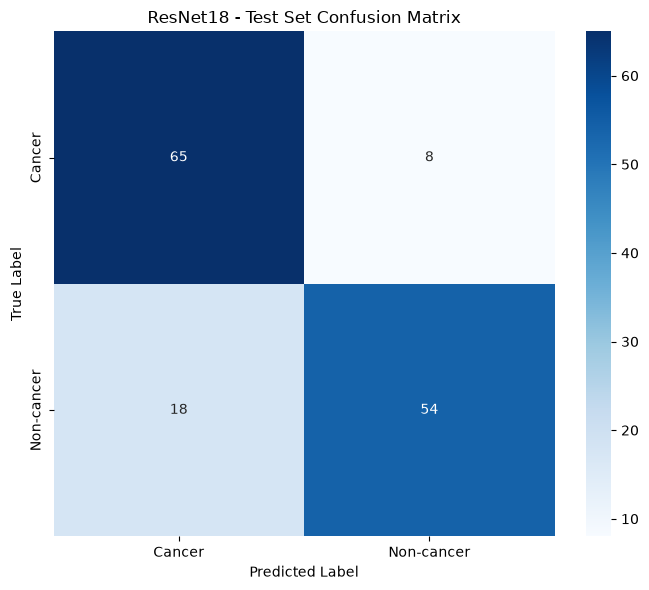


CLASSIFICATION REPORT
              precision    recall  f1-score   support

      Cancer     0.7831    0.8904    0.8333        73
  Non-cancer     0.8710    0.7500    0.8060        72

    accuracy                         0.8207       145
   macro avg     0.8271    0.8202    0.8197       145
weighted avg     0.8267    0.8207    0.8197       145



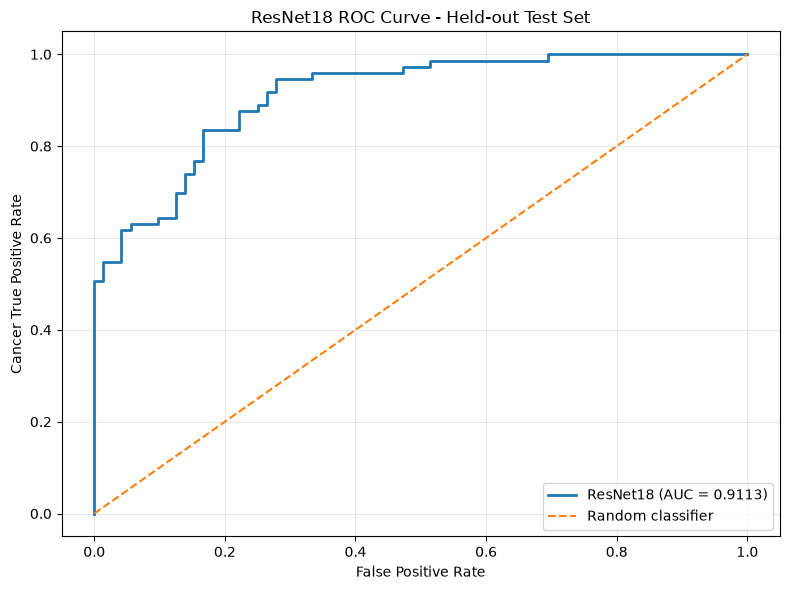


Sanity checks:
Number of test images: 145
Cancer predictions: 83
Non-cancer predictions: 62


In [10]:
# ============================================================
# RESNET18 BINARY ORAL CANCER CLASSIFICATION
# HELD-OUT TEST SET EVALUATION
# ============================================================

import os
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import seaborn as sns

from torchvision import models
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
    classification_report,
    roc_auc_score,
    roc_curve,
)

# This mapping must match OralCancerDataset.label_map.
LABEL_MAP = {
    "cancer": 0,
    "non_cancer": 1,
}
CLASS_NAMES = ["Cancer", "Non-cancer"]
CANCER_INDEX = LABEL_MAP["cancer"]
NON_CANCER_INDEX = LABEL_MAP["non_cancer"]
assert CLASS_NAMES[CANCER_INDEX] == "Cancer"
assert CLASS_NAMES[NON_CANCER_INDEX] == "Non-cancer"


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = models.resnet18(weights=None)
model.fc = nn.Linear(model.fc.in_features, 2)
model = model.to(device)

best_model_path = "best_oral_cancer_resnet18.pth"
if not os.path.exists(best_model_path):
    raise FileNotFoundError(
        f"Could not find {best_model_path}. Run the training cell first."
    )

model.load_state_dict(torch.load(best_model_path, map_location=device))
model.eval()

print("Device:", device)
print("Best ResNet18 model loaded successfully.")
print("Class mapping: 0 = Cancer, 1 = Non-cancer")

all_true_labels = []
all_pred_labels = []
all_cancer_probabilities = []

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)
        probabilities = torch.softmax(model(images), dim=1)
        predictions = torch.argmax(probabilities, dim=1)

        all_true_labels.extend(labels.cpu().numpy())
        all_pred_labels.extend(predictions.cpu().numpy())
        all_cancer_probabilities.extend(
            probabilities[:, CANCER_INDEX].cpu().numpy()
        )

y_true = np.asarray(all_true_labels)
y_pred = np.asarray(all_pred_labels)
y_prob = np.asarray(all_cancer_probabilities)

accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(
    y_true, y_pred, pos_label=CANCER_INDEX, zero_division=0
)
recall = recall_score(
    y_true, y_pred, pos_label=CANCER_INDEX, zero_division=0
)
f1 = f1_score(
    y_true, y_pred, pos_label=CANCER_INDEX, zero_division=0
)
roc_auc = roc_auc_score(y_true == CANCER_INDEX, y_prob)

# confusion_matrix uses [actual cancer, actual non-cancer] here.
cm = confusion_matrix(
    y_true,
    y_pred,
    labels=[CANCER_INDEX, NON_CANCER_INDEX],
)
tp, fn, fp, tn = cm.ravel()
specificity = tn / (tn + fp) if (tn + fp) else 0.0

print("\n" + "=" * 60)
print("RESNET18 TEST SET RESULTS")
print("=" * 60)
print(f"Accuracy     : {accuracy:.4f} ({accuracy:.2%})")
print(f"Precision    : {precision:.4f} ({precision:.2%})")
print(f"Recall       : {recall:.4f} ({recall:.2%})")
print(f"Sensitivity  : {recall:.4f} ({recall:.2%})")
print(f"Specificity  : {specificity:.4f} ({specificity:.2%})")
print(f"F1-score     : {f1:.4f}")
print(f"ROC-AUC      : {roc_auc:.4f}")
print("=" * 60)
print(f"\nTrue Positives  (Cancer): {tp}")
print(f"False Negatives (Cancer): {fn}")
print(f"False Positives (Cancer): {fp}")
print(f"True Negatives  (Cancer): {tn}")

plt.figure(figsize=(7, 6))
sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=CLASS_NAMES,
    yticklabels=CLASS_NAMES,
)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("ResNet18 - Test Set Confusion Matrix")
plt.tight_layout()
plt.show()

print("\n" + "=" * 60)
print("CLASSIFICATION REPORT")
print("=" * 60)
print(
    classification_report(
        y_true,
        y_pred,
        labels=[CANCER_INDEX, NON_CANCER_INDEX],
        target_names=CLASS_NAMES,
        digits=4,
        zero_division=0,
    )
)

fpr, tpr, thresholds = roc_curve(
    y_true == CANCER_INDEX,
    y_prob,
)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"ResNet18 (AUC = {roc_auc:.4f})", linewidth=2)
plt.plot([0, 1], [0, 1], linestyle="--", label="Random classifier")
plt.xlabel("False Positive Rate")
plt.ylabel("Cancer True Positive Rate")
plt.title("ResNet18 ROC Curve - Held-out Test Set")
plt.legend(loc="lower right")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

print("\nSanity checks:")
print("Number of test images:", len(y_true))
print("Cancer predictions:", int(np.sum(y_pred == CANCER_INDEX)))
print("Non-cancer predictions:", int(np.sum(y_pred == NON_CANCER_INDEX)))

**Step 8 — Add Grad-CAM explainability**

Device: cpu
Class mapping: 0 = Cancer, 1 = Non-cancer
Predictions generated: 145

Prediction categories:
Correct Cancer: 65
False Negatives: 8
Correct Non-cancer: 54
False Positives: 18


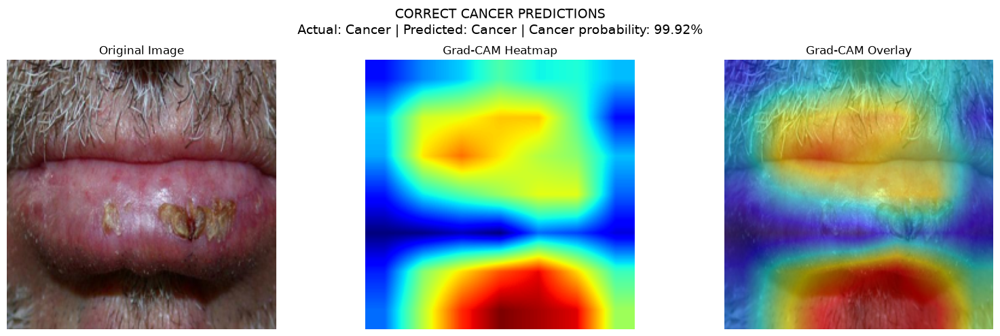

Image: /Users/deeshanikhilkalantri/Desktop/Oral Cancer/OralCancer dataset/Oral_Cancer_Detection/Clinical oral images/cancer/109.jpeg
Actual class: Cancer
Predicted class: Cancer
Cancer probability: 0.9992


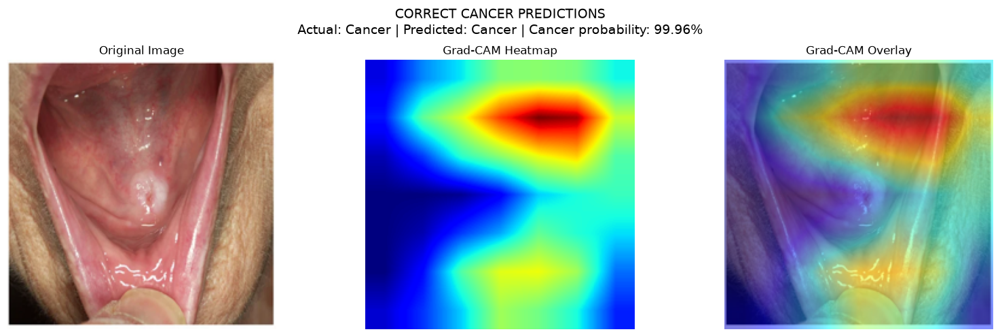

Image: /Users/deeshanikhilkalantri/Desktop/Oral Cancer/OralCancer dataset/Oral_Cancer_Detection/Clinical oral images/cancer/493.jpeg
Actual class: Cancer
Predicted class: Cancer
Cancer probability: 0.9996


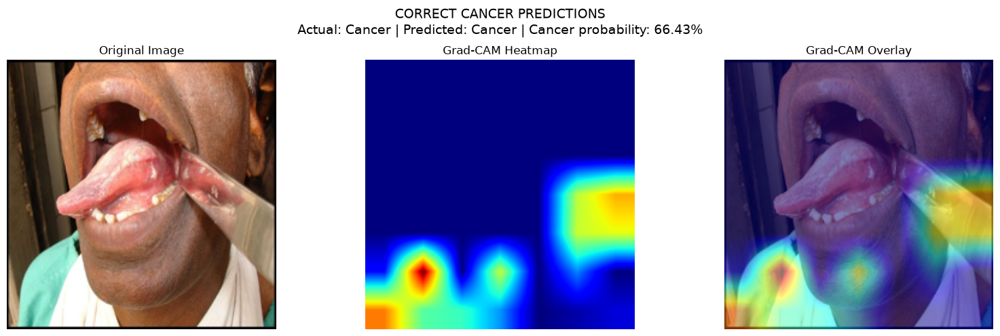

Image: /Users/deeshanikhilkalantri/Desktop/Oral Cancer/OralCancer dataset/Oral_Cancer_Detection/Clinical oral images/cancer/049.jpeg
Actual class: Cancer
Predicted class: Cancer
Cancer probability: 0.6643


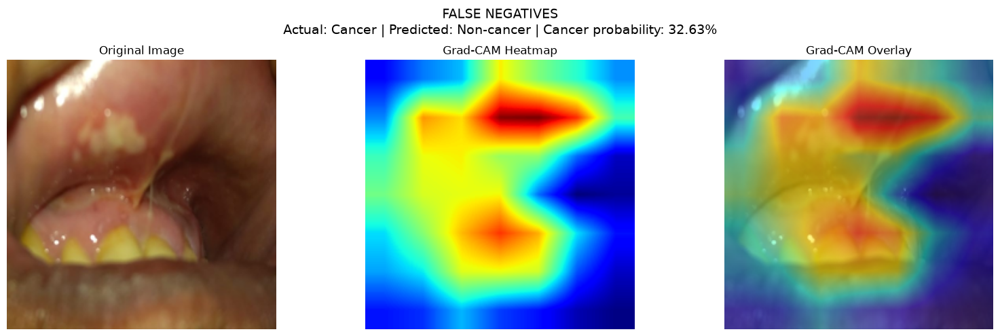

Image: /Users/deeshanikhilkalantri/Desktop/Oral Cancer/OralCancer dataset/Oral_Cancer_Detection/Clinical oral images/cancer/384.jpeg
Actual class: Cancer
Predicted class: Non-cancer
Cancer probability: 0.3263


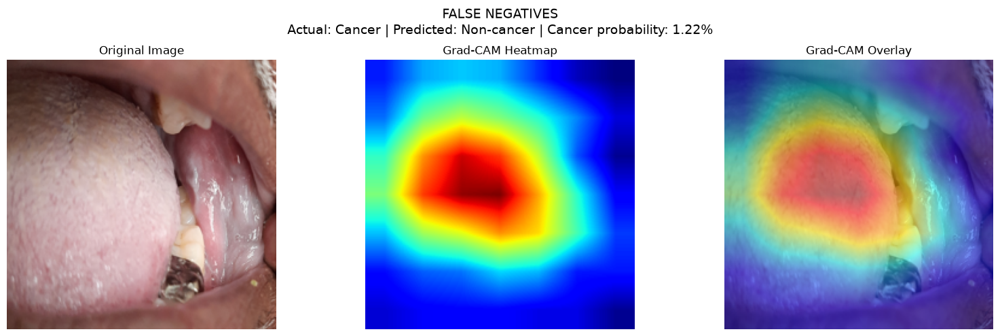

Image: /Users/deeshanikhilkalantri/Desktop/Oral Cancer/OralCancer dataset/Oral_Cancer_Detection/Clinical oral images/cancer/395.jpeg
Actual class: Cancer
Predicted class: Non-cancer
Cancer probability: 0.0122


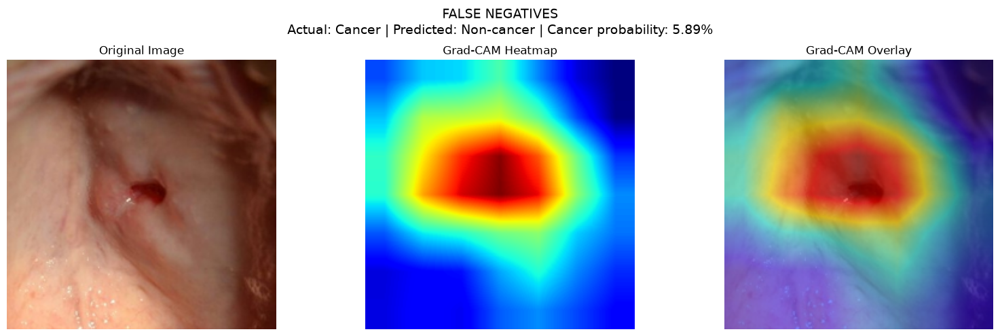

Image: /Users/deeshanikhilkalantri/Desktop/Oral Cancer/OralCancer dataset/Oral_Cancer_Detection/Clinical oral images/cancer/167.jpeg
Actual class: Cancer
Predicted class: Non-cancer
Cancer probability: 0.0589


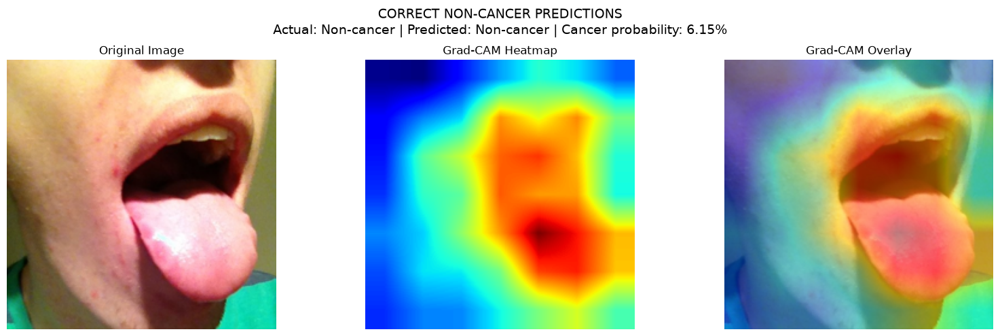

Image: /Users/deeshanikhilkalantri/Desktop/Oral Cancer/OralCancer dataset/Oral_Cancer_Detection/Clinical oral images/non-cancer/144.jpeg
Actual class: Non-cancer
Predicted class: Non-cancer
Cancer probability: 0.0615


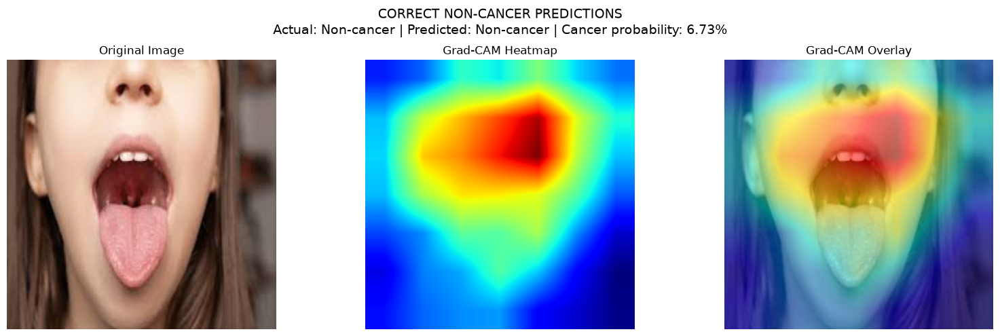

Image: /Users/deeshanikhilkalantri/Desktop/Oral Cancer/OralCancer dataset/Oral_Cancer_Detection/Clinical oral images/non-cancer/146.jpeg
Actual class: Non-cancer
Predicted class: Non-cancer
Cancer probability: 0.0673


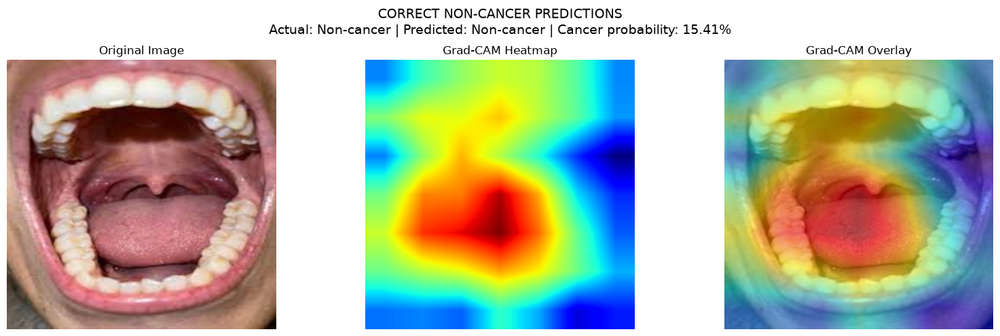

Image: /Users/deeshanikhilkalantri/Desktop/Oral Cancer/OralCancer dataset/Oral_Cancer_Detection/Clinical oral images/non-cancer/185.jpeg
Actual class: Non-cancer
Predicted class: Non-cancer
Cancer probability: 0.1541


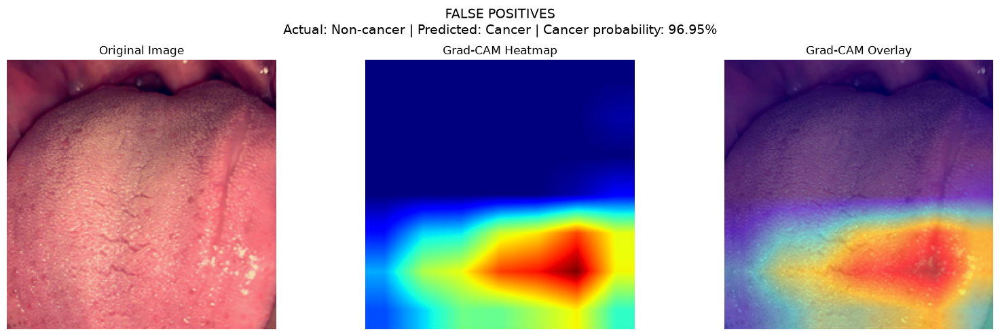

Image: /Users/deeshanikhilkalantri/Desktop/Oral Cancer/OralCancer dataset/Oral_Cancer_Detection/Clinical oral images/non-cancer/053.jpeg
Actual class: Non-cancer
Predicted class: Cancer
Cancer probability: 0.9695


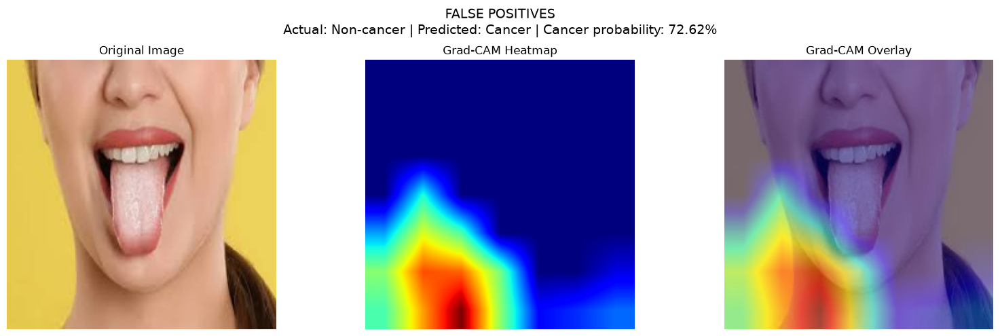

Image: /Users/deeshanikhilkalantri/Desktop/Oral Cancer/OralCancer dataset/Oral_Cancer_Detection/Clinical oral images/non-cancer/155.jpeg
Actual class: Non-cancer
Predicted class: Cancer
Cancer probability: 0.7262


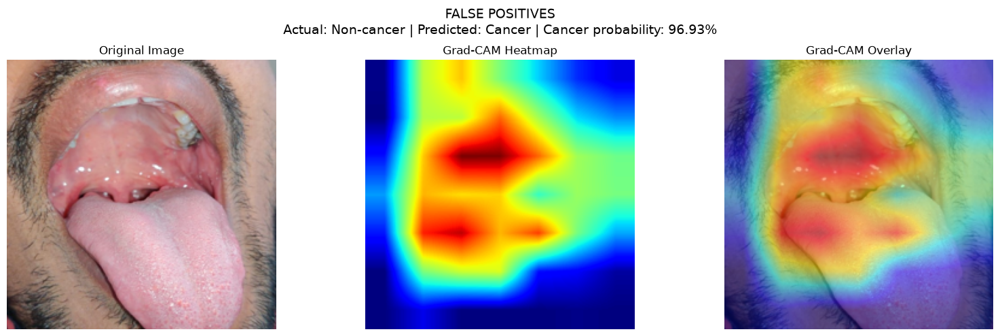

Image: /Users/deeshanikhilkalantri/Desktop/Oral Cancer/OralCancer dataset/Oral_Cancer_Detection/Clinical oral images/non-cancer/082.jpeg
Actual class: Non-cancer
Predicted class: Cancer
Cancer probability: 0.9693

Grad-CAM highlights model-relevant regions; it is not a medical diagnosis.


In [11]:
# ============================================================
# RESNET18 GRAD-CAM EXPLAINABILITY
# ============================================================

import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import matplotlib.pyplot as plt

from PIL import Image
from torchvision import models, transforms
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image


# This mapping must match OralCancerDataset.label_map.
LABEL_MAP = {
    "cancer": 0,
    "non_cancer": 1,
}
CLASS_NAMES = ["Cancer", "Non-cancer"]
CANCER_INDEX = LABEL_MAP["cancer"]
NON_CANCER_INDEX = LABEL_MAP["non_cancer"]
assert CLASS_NAMES[CANCER_INDEX] == "Cancer"
assert CLASS_NAMES[NON_CANCER_INDEX] == "Non-cancer"

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = models.resnet18(weights=None)
model.fc = nn.Linear(model.fc.in_features, 2)
model = model.to(device)

best_model_path = "best_oral_cancer_resnet18.pth"
if not os.path.exists(best_model_path):
    raise FileNotFoundError(
        f"Model not found: {best_model_path}. Run the training cell first."
    )
model.load_state_dict(torch.load(best_model_path, map_location=device))
model.eval()

IMAGE_SIZE = 224
eval_transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225],
    ),
])
target_layers = [model.layer4[-1].conv2]

if "test_df" not in globals():
    raise NameError("Run the dataset split cell before this cell.")

results = []
with torch.no_grad():
    for _, row in test_df.iterrows():
        image_path = row["image_path"]
        try:
            image = Image.open(image_path).convert("RGB")
            input_tensor = eval_transform(image).unsqueeze(0).to(device)
            probabilities = torch.softmax(model(input_tensor), dim=1)[0]
            predicted_label = int(torch.argmax(probabilities).item())
            results.append({
                "image_path": image_path,
                "actual": LABEL_MAP[row["label"]],
                "predicted": predicted_label,
                "predicted_probability": float(probabilities[predicted_label]),
                "cancer_probability": float(probabilities[CANCER_INDEX]),
            })
        except Exception as error:
            print(f"Could not process {image_path}: {error}")

results_df = pd.DataFrame(results)
print("Device:", device)
print("Class mapping: 0 = Cancer, 1 = Non-cancer")
print("Predictions generated:", len(results_df))

correct_cancer = results_df[
    (results_df["actual"] == CANCER_INDEX)
    & (results_df["predicted"] == CANCER_INDEX)
]
false_negative = results_df[
    (results_df["actual"] == CANCER_INDEX)
    & (results_df["predicted"] == NON_CANCER_INDEX)
]
correct_non_cancer = results_df[
    (results_df["actual"] == NON_CANCER_INDEX)
    & (results_df["predicted"] == NON_CANCER_INDEX)
]
false_positive = results_df[
    (results_df["actual"] == NON_CANCER_INDEX)
    & (results_df["predicted"] == CANCER_INDEX)
]

print("\nPrediction categories:")
print("Correct Cancer:", len(correct_cancer))
print("False Negatives:", len(false_negative))
print("Correct Non-cancer:", len(correct_non_cancer))
print("False Positives:", len(false_positive))


def generate_gradcam(image_path, predicted_class):
    image = Image.open(image_path).convert("RGB")
    display_image = image.resize((IMAGE_SIZE, IMAGE_SIZE))
    rgb_image = np.asarray(display_image).astype(np.float32) / 255.0
    input_tensor = eval_transform(image).unsqueeze(0).to(device)

    with GradCAM(model=model, target_layers=target_layers) as cam:
        grayscale_cam = cam(
            input_tensor=input_tensor,
            targets=[ClassifierOutputTarget(predicted_class)],
        )[0]

    overlay = show_cam_on_image(rgb_image, grayscale_cam, use_rgb=True)
    return rgb_image, grayscale_cam, overlay


def display_result(row, category):
    actual_class = int(row["actual"])
    predicted_class = int(row["predicted"])
    original, heatmap, overlay = generate_gradcam(
        row["image_path"],
        predicted_class,
    )

    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    axes[0].imshow(original)
    axes[0].set_title("Original Image")
    axes[1].imshow(heatmap, cmap="jet")
    axes[1].set_title("Grad-CAM Heatmap")
    axes[2].imshow(overlay)
    axes[2].set_title("Grad-CAM Overlay")
    for axis in axes:
        axis.axis("off")
    plt.suptitle(
        f"{category}\n"
        f"Actual: {CLASS_NAMES[actual_class]} | "
        f"Predicted: {CLASS_NAMES[predicted_class]} | "
        f"Cancer probability: {row['cancer_probability']:.2%}",
        fontsize=14,
    )
    plt.tight_layout()
    plt.show()

    print("Image:", row["image_path"])
    print("Actual class:", CLASS_NAMES[actual_class])
    print("Predicted class:", CLASS_NAMES[predicted_class])
    print(f"Cancer probability: {row['cancer_probability']:.4f}")


def show_examples(dataframe, category, n=3):
    if dataframe.empty:
        print(f"No examples available: {category}")
        return
    for _, row in dataframe.head(n).iterrows():
        display_result(row, category)


show_examples(correct_cancer, "CORRECT CANCER PREDICTIONS")
show_examples(false_negative, "FALSE NEGATIVES")
show_examples(correct_non_cancer, "CORRECT NON-CANCER PREDICTIONS")
show_examples(false_positive, "FALSE POSITIVES")

print("\nGrad-CAM highlights model-relevant regions; it is not a medical diagnosis.")

**Step 9 — Save the model and create a prediction function**

In [ ]:
# ============================================================
# RESNET18 ORAL CANCER - CORRECTED INFERENCE
# ============================================================

import os
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt

from PIL import Image
from torchvision import models, transforms
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

try:
    from google.colab import files
    IN_COLAB = True
except ImportError:
    IN_COLAB = False


# This must match OralCancerDataset.label_map used during training.
LABEL_MAP = {
    "cancer": 0,
    "non_cancer": 1,
}
CLASS_NAMES = ["Cancer", "Non-cancer"]
assert LABEL_MAP["cancer"] == 0 and CLASS_NAMES[0] == "Cancer"


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

model = models.resnet18(weights=None)
model.fc = nn.Linear(model.fc.in_features, 2)
model = model.to(device)

model_candidates = [
    os.path.join(os.getcwd(), "best_oral_cancer_resnet18.pth"),
    os.path.join("/content", "best_oral_cancer_resnet18.pth"),
]
best_model_path = next(
    (path for path in model_candidates if os.path.exists(path)),
    None,
)
if best_model_path is None:
    raise FileNotFoundError(
        "best_oral_cancer_resnet18.pth was not found. Run the training cell first."
    )

model.load_state_dict(torch.load(best_model_path, map_location=device))
model.eval()
print("Best ResNet18 model loaded successfully:", best_model_path)
print("Class mapping: 0 = Cancer, 1 = Non-cancer")

IMAGE_SIZE = 224
eval_transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225],
    ),
])

if IN_COLAB:
    print("\nPlease select a new oral image to classify.")
    uploaded = files.upload()
    if not uploaded:
        raise ValueError("No image was uploaded.")
    uploaded_filename = next(iter(uploaded))
    image_path = os.path.join("/content", uploaded_filename)
else:
    image_path = input("Enter the path to an oral image: ").strip()
    if not image_path:
        raise ValueError("An image path is required.")
    image_path = os.path.abspath(os.path.expanduser(image_path))
    uploaded_filename = os.path.basename(image_path)

if not os.path.isfile(image_path):
    raise FileNotFoundError(f"Image not found: {image_path}")

image = Image.open(image_path).convert("RGB")
input_tensor = eval_transform(image).unsqueeze(0).to(device)

with torch.no_grad():
    probabilities = torch.softmax(model(input_tensor), dim=1)[0]

predicted_class = int(torch.argmax(probabilities).item())
predicted_name = CLASS_NAMES[predicted_class]
cancer_probability = float(probabilities[LABEL_MAP["cancer"]].item())
non_cancer_probability = float(probabilities[LABEL_MAP["non_cancer"]].item())
confidence = float(probabilities[predicted_class].item())

print("\n" + "=" * 65)
print("RESNET18 ORAL CANCER PREDICTION")
print("=" * 65)
print(f"Predicted class       : {predicted_name}")
print(f"Cancer probability    : {cancer_probability:.4f} ({cancer_probability:.2%})")
print(f"Non-cancer probability: {non_cancer_probability:.4f} ({non_cancer_probability:.2%})")
print(f"Confidence            : {confidence:.4f} ({confidence:.2%})")
print("=" * 65)

plt.figure(figsize=(6, 6))
plt.imshow(image)
plt.title(f"Predicted: {predicted_name} ({confidence:.2%})")
plt.axis("off")
plt.show()

show_gradcam = True
if show_gradcam:
    rgb_image = np.array(image.resize((IMAGE_SIZE, IMAGE_SIZE))).astype(np.float32) / 255.0
    with GradCAM(model=model, target_layers=[model.layer4[-1].conv2]) as cam:
        grayscale_cam = cam(
            input_tensor=input_tensor,
            targets=[ClassifierOutputTarget(predicted_class)],
        )[0]
    cam_overlay = show_cam_on_image(rgb_image, grayscale_cam, use_rgb=True)
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    axes[0].imshow(rgb_image)
    axes[0].set_title("Original Image")
    axes[1].imshow(grayscale_cam, cmap="jet")
    axes[1].set_title("Grad-CAM Heatmap")
    axes[2].imshow(cam_overlay)
    axes[2].set_title(f"Grad-CAM: {predicted_name}")
    for axis in axes:
        axis.axis("off")
    plt.tight_layout()
    plt.show()

result = {
    "image": uploaded_filename,
    "predicted_class": predicted_name,
    "cancer_probability": cancer_probability,
    "non_cancer_probability": non_cancer_probability,
    "confidence": confidence,
}
print("\nFinal result:")
print(result)
print("\nThese are model scores, not medically validated probabilities or a diagnosis.")

Using device: cpu
Best ResNet18 model loaded successfully: /Users/deeshanikhilkalantri/Desktop/Oral Cancer/OralCancer dataset/Oral_Cancer_Detection/best_oral_cancer_resnet18.pth
Class mapping: 0 = Cancer, 1 = Non-cancer


In [ ]:
import os
import shutil

dataset_root = "/content"
cancer_path = os.path.join(dataset_root, "cancer")
non_cancer_path = os.path.join(dataset_root, "non-cancer")

# Remove existing directories if they exist
if os.path.exists(cancer_path):
    shutil.rmtree(cancer_path)
    print(f"Removed existing directory: {cancer_path}")

if os.path.exists(non_cancer_path):
    shutil.rmtree(non_cancer_path)
    print(f"Removed existing directory: {non_cancer_path}")

# Recreate empty directories
os.makedirs(cancer_path, exist_ok=True)
os.makedirs(non_cancer_path, exist_ok=True)

print(f"Emptied and recreated: {cancer_path}")
print(f"Emptied and recreated: {non_cancer_path}")

Removed existing directory: /content/cancer
Removed existing directory: /content/non-cancer
Emptied and recreated: /content/cancer
Emptied and recreated: /content/non-cancer
